<img src="https://github.com/nicholasmetherall/digital-earth-pacific-macblue-activities/blob/main/attachments/images/DE_Pacific_banner.JPG?raw=true" width="900"/>
Figure 1.1.a. Jupyter environment + Python notebooks

### Digital Earth Pacific Notebook 1 Train Random Forest Machine Learning (ML) Model

<font color='green'>The objective of this notebook is to train a machine learning model that will allow us to classify an area with the land cover classes defined through the training data. </font>

<font color='blue'>Setup libaries</font>

In [1]:
from pystac_client import Client
from dask.distributed import Client as DaskClient
from odc.stac import load, configure_s3_access
import rasterio as rio
import geopandas as gpd
import pandas as pd
import numpy as np
import xarray as xr
import folium
import utils
from utils import load_data
from utils import mask_and_scale
from sklearn.ensemble import RandomForestClassifier
import odc.geo.xr
import rioxarray
import matplotlib.pyplot as plt

<font color='blue'>Define catalogue</font>

In [2]:
catalog = "https://stac.digitalearthpacific.org"
client = Client.open(catalog)

In [3]:
client = Client.open(catalog)

<font color='red'>Define your area of interest - copy and paste the bottom left latitude (min_lat) and the bottem left longitude (min_lon) and the top right latitude (max_lat) and the top right longitude (max_lon)

<font color='red'>In this activity you can use the following examples: 
`-18.1313, -18.1553, 177.4347, 177.4032`
  
<font color='red'>  Note we have reordered these into the wrong order so you will have to define them correctly below:</font>

In [4]:
min_lat = -18.20459
min_lon = 178.33041
max_lat = -18.10000 
max_lon = 178.53506
bbox = [min_lon, min_lat, max_lon, max_lat]

<font color='red'>Define your time of interest - choose a range of a few months in 2024 using the syntax `datetime="YYYY-MM/YYYY-MM"`</font>

In [5]:
datetime="2024"

items = list(client.search(collections=["dep_s2_geomad"], datetime=datetime, bbox=bbox).items())

print(f"Found {len(items)} items")

Found 1 items


In [6]:
from pystac import Collection

<font color='red'>Connect to parallel computers for greater computational capacity - note you should only run this line of code once per notebook activity - do not rerun this line</font>

In [7]:
collection = Collection.from_file("https://stac.digitalearthpacific.org/collections/dep_s2_geomad")

In [8]:
collection

<Collection id=dep_s2_geomad>

In [9]:
data = load(
        items,
        measurements=[
            "nir", "red", "blue", "green", "emad", "smad", 
            "bcmad", "count", "green", "nir08", 
            "nir09", "swir16", "swir22", "coastal",
            "rededge1", "rededge2", "rededge3", 
        ],
        bbox=bbox,
        chunks={"x": 2048, "y": 2048},
        groupby="solar_day",
    )

In [10]:
dask_client = DaskClient(n_workers=1, threads_per_worker=16, memory_limit='16GB')

configure_s3_access(cloud_defaults=True, requester_pays=True)

/srv/conda/envs/notebook/lib/python3.10/site-packages/distributed/node.py:182: UserWarning: Port 8787 is already in use.
Perhaps you already have a cluster running?
Hosting the HTTP server on port 35189 instead
  warnings.warn(


<font color='green'>Search through the catalogue - define the cloud cover threshold you want. Try changing 80 to 50 here: `{"lt": 50}},` </font>

<font color='blue'>Load your satellite dataset based on your search parameters defined above</font>

<font color='blue'>Set scale and masks and consider the dataset information below including the bands used for analysis:</font>

In [11]:
# Apply scaling and clip values from 0 to / do we need to scale for the GeoMAD 
scaled = (data.where(data != 0) * 0.0001).clip(0, 1)
scaled

scaled = scaled.assign_coords(band=["nir", "red", "blue", "green", "emad", "smad", "bcmad", "count", "green", "nir08", "nir09", "swir16", "swir22", "coastal","rededge1", "rededge2", "rededge3", ])
scaled

<xarray.Dataset> Size: 178MB
Dimensions:      (time: 1, y: 1219, x: 2279, band: 17)
Coordinates:
  * y            (y) float64 10kB -2.036e+06 -2.036e+06 ... -2.048e+06
  * x            (x) float64 18kB 3.154e+06 3.154e+06 ... 3.176e+06 3.177e+06
    spatial_ref  int32 4B 3832
  * time         (time) datetime64[ns] 8B 2024-01-01
  * band         (band) <U8 544B 'nir' 'red' 'blue' ... 'rededge2' 'rededge3'
Data variables: (12/16)
    nir          (time, y, x) float32 11MB dask.array<chunksize=(1, 1219, 2048), meta=np.ndarray>
    red          (time, y, x) float32 11MB dask.array<chunksize=(1, 1219, 2048), meta=np.ndarray>
    blue         (time, y, x) float32 11MB dask.array<chunksize=(1, 1219, 2048), meta=np.ndarray>
    green        (time, y, x) float32 11MB dask.array<chunksize=(1, 1219, 2048), meta=np.ndarray>
    emad         (time, y, x) float32 11MB dask.array<chunksize=(1, 1219, 2048), meta=np.ndarray>
    smad         (time, y, x) float32 11MB dask.array<chunksize=(1, 1219, 2048), meta=np.ndarray>
    ...           ...
    swir16       (time, y, x) float32 11MB dask.array<chunksize=(1, 1219, 2048), meta=np.ndarray>
    swir22       (time, y, x) float32 11MB dask.array<chunksize=(1, 1219, 2048), meta=np.ndarray>
    coastal      (time, y, x) float32 11MB dask.array<chunksize=(1, 1219, 2048), meta=np.ndarray>
    rededge1     (time, y, x) float32 11MB dask.array<chunksize=(1, 1219, 2048), meta=np.ndarray>
    rededge2     (time, y, x) float32 11MB dask.array<chunksize=(1, 1219, 2048), meta=np.ndarray>
    rededge3     (time, y, x) float32 11MB dask.array<chunksize=(1, 1219, 2048), meta=np.ndarray>

<font color='blue'>Explore the satellite image dataset you have loaded</font>

In [ ]:
scaled.odc.explore(bands=("red", "green", "blue"), vmin=0, vmax=0.3)


Generate an image

<font color='red'>The formula for the Modified Normalized Difference Water Index (MDNWI) is: 

- <font color='red'>\(MNDWI=(Green-SWIR)/(Green+SWIR)\)

<font color='red'>Define a variable to store both MNDWI and NDTI using the median xarray dataset

In [ ]:
# should we use B11 or B12 for SWIR
mndwi = (scaled["green"]-scaled["swir16"])/(scaled["green"]+scaled["swir16"])


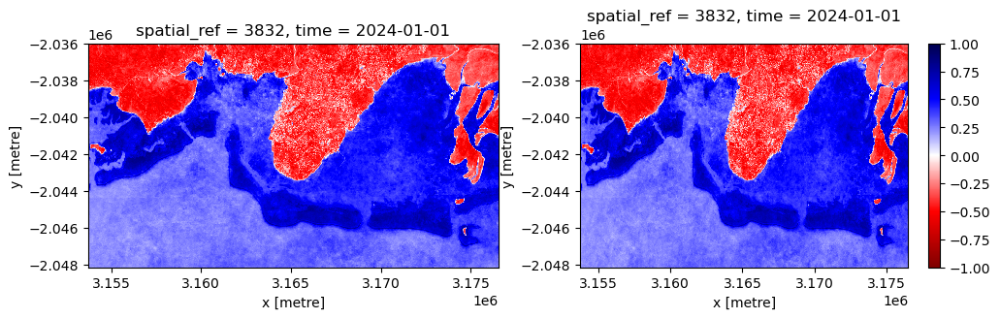

In [14]:
fig, ax = plt.subplots(1, 2, figsize=(12, 3))
cmap_mndwi='seismic_r'

vmin=-1
vmax=1

mndwi.plot(ax=ax[0], cmap=cmap_mndwi, add_colorbar=False, vmin=vmin, vmax=vmax)
mndwi.plot(ax=ax[1], cmap=cmap_mndwi, add_colorbar=True, vmin=vmin, vmax=vmax);

In [15]:
mndwi.odc.explore(cmap='seismic_r', vmin=-1, vmax=1)


In [16]:
mndwi = mndwi.squeeze() 

mndwi # Removes dimensions of size 1 (if applicable)

<xarray.DataArray (y: 1219, x: 2279)> Size: 11MB
dask.array<getitem, shape=(1219, 2279), dtype=float32, chunksize=(1219, 2048), chunktype=numpy.ndarray>
Coordinates:
  * y            (y) float64 10kB -2.036e+06 -2.036e+06 ... -2.048e+06
  * x            (x) float64 18kB 3.154e+06 3.154e+06 ... 3.176e+06 3.177e+06
    spatial_ref  int32 4B 3832
    time         datetime64[ns] 8B 2024-01-01

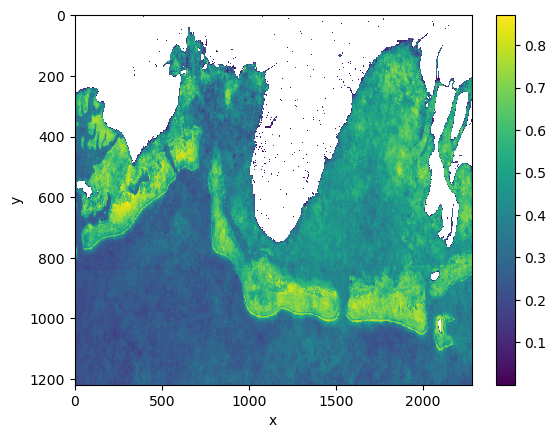

In [17]:
land_mask = mndwi > 0
masked_raster = np.ma.masked_where(~land_mask, mndwi)
masked_raster_da = xr.DataArray(masked_raster)
masked_raster_da = masked_raster_da.rename({"dim_0": "y", "dim_1": "x"})
masked_raster_da
masked_raster_da.plot.imshow(origin="upper")

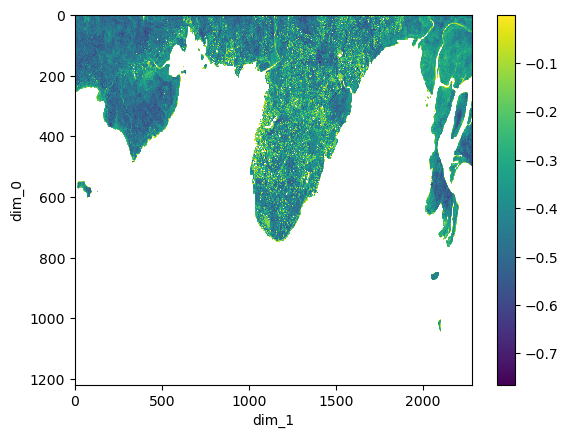

In [18]:
ocean_mask = mndwi < 0
masked_raster = np.ma.masked_where(~ocean_mask, mndwi)
masked_raster_da = xr.DataArray(masked_raster)
masked_raster_da.plot.imshow(origin="upper")

In [19]:
masked_raster_da

<xarray.DataArray (dim_0: 1219, dim_1: 2279)> Size: 11MB
array([[-0.5201207 , -0.49752724, -0.48366013, ..., -0.48281252,
        -0.45852533, -0.46359584],
       [-0.47109103, -0.4610778 , -0.4469357 , ..., -0.4960506 ,
        -0.5126382 , -0.4864661 ],
       [-0.42829174, -0.43925238, -0.4321991 , ..., -0.5048762 ,
        -0.50356203, -0.44058084],
       ...,
       [        nan,         nan,         nan, ...,         nan,
                nan,         nan],
       [        nan,         nan,         nan, ...,         nan,
                nan,         nan],
       [        nan,         nan,         nan, ...,         nan,
                nan,         nan]], dtype=float32)
Dimensions without coordinates: dim_0, dim_1

In [20]:
scaled

<xarray.Dataset> Size: 178MB
Dimensions:      (time: 1, y: 1219, x: 2279, band: 17)
Coordinates:
  * y            (y) float64 10kB -2.036e+06 -2.036e+06 ... -2.048e+06
  * x            (x) float64 18kB 3.154e+06 3.154e+06 ... 3.176e+06 3.177e+06
    spatial_ref  int32 4B 3832
  * time         (time) datetime64[ns] 8B 2024-01-01
  * band         (band) <U8 544B 'nir' 'red' 'blue' ... 'rededge2' 'rededge3'
Data variables: (12/16)
    nir          (time, y, x) float32 11MB dask.array<chunksize=(1, 1219, 2048), meta=np.ndarray>
    red          (time, y, x) float32 11MB dask.array<chunksize=(1, 1219, 2048), meta=np.ndarray>
    blue         (time, y, x) float32 11MB dask.array<chunksize=(1, 1219, 2048), meta=np.ndarray>
    green        (time, y, x) float32 11MB dask.array<chunksize=(1, 1219, 2048), meta=np.ndarray>
    emad         (time, y, x) float32 11MB dask.array<chunksize=(1, 1219, 2048), meta=np.ndarray>
    smad         (time, y, x) float32 11MB dask.array<chunksize=(1, 1219, 2048), meta=np.ndarray>
    ...           ...
    swir16       (time, y, x) float32 11MB dask.array<chunksize=(1, 1219, 2048), meta=np.ndarray>
    swir22       (time, y, x) float32 11MB dask.array<chunksize=(1, 1219, 2048), meta=np.ndarray>
    coastal      (time, y, x) float32 11MB dask.array<chunksize=(1, 1219, 2048), meta=np.ndarray>
    rededge1     (time, y, x) float32 11MB dask.array<chunksize=(1, 1219, 2048), meta=np.ndarray>
    rededge2     (time, y, x) float32 11MB dask.array<chunksize=(1, 1219, 2048), meta=np.ndarray>
    rededge3     (time, y, x) float32 11MB dask.array<chunksize=(1, 1219, 2048), meta=np.ndarray>

In [21]:
# Clip da1 using the mask from da2
clipped_ds = scaled.where(land_mask)
clipped_ds = clipped_ds.squeeze()
# clipped_da = clipped_da.rename({"dim_0": "y", "dim_1": "x"})

clipped_ds


<xarray.Dataset> Size: 178MB
Dimensions:      (y: 1219, x: 2279, band: 17)
Coordinates:
  * y            (y) float64 10kB -2.036e+06 -2.036e+06 ... -2.048e+06
  * x            (x) float64 18kB 3.154e+06 3.154e+06 ... 3.176e+06 3.177e+06
    spatial_ref  int32 4B 3832
    time         datetime64[ns] 8B 2024-01-01
  * band         (band) <U8 544B 'nir' 'red' 'blue' ... 'rededge2' 'rededge3'
Data variables: (12/16)
    nir          (y, x) float32 11MB dask.array<chunksize=(1219, 2048), meta=np.ndarray>
    red          (y, x) float32 11MB dask.array<chunksize=(1219, 2048), meta=np.ndarray>
    blue         (y, x) float32 11MB dask.array<chunksize=(1219, 2048), meta=np.ndarray>
    green        (y, x) float32 11MB dask.array<chunksize=(1219, 2048), meta=np.ndarray>
    emad         (y, x) float32 11MB dask.array<chunksize=(1219, 2048), meta=np.ndarray>
    smad         (y, x) float32 11MB dask.array<chunksize=(1219, 2048), meta=np.ndarray>
    ...           ...
    swir16       (y, x) float32 11MB dask.array<chunksize=(1219, 2048), meta=np.ndarray>
    swir22       (y, x) float32 11MB dask.array<chunksize=(1219, 2048), meta=np.ndarray>
    coastal      (y, x) float32 11MB dask.array<chunksize=(1219, 2048), meta=np.ndarray>
    rededge1     (y, x) float32 11MB dask.array<chunksize=(1219, 2048), meta=np.ndarray>
    rededge2     (y, x) float32 11MB dask.array<chunksize=(1219, 2048), meta=np.ndarray>
    rededge3     (y, x) float32 11MB dask.array<chunksize=(1219, 2048), meta=np.ndarray>

In [22]:
clipped_ds.odc.explore(bands=("red", "green", "blue"), vmin=0, vmax=0.3)


<font color='red'>The formula for the Normalized Difference Turbidity Index (NDTI) index is: 

- <font color='red'>\(NDTI = (Red - Green) / (Red + Green)\)

In [23]:
ndti = (clipped_ds["red"]-clipped_ds["green"])/(clipped_ds["red"]+clipped_ds["green"])


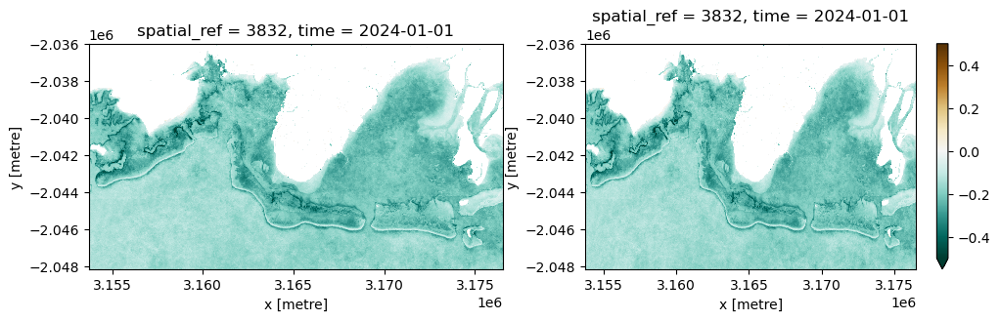

In [24]:
fig, ax = plt.subplots(1, 2, figsize=(12, 3))
cmap_ndti='BrBG_r'

vmin=-0.5
vmax=0.5

ndti.plot(ax=ax[0], cmap=cmap_ndti, add_colorbar=False, vmin=vmin, vmax=vmax)
ndti.plot(ax=ax[1], cmap=cmap_ndti, add_colorbar=True, vmin=vmin, vmax=vmax);

In [25]:
ndti.odc.explore(cmap=cmap_ndti, add_colorbar=True, vmin=vmin, vmax=vmax)


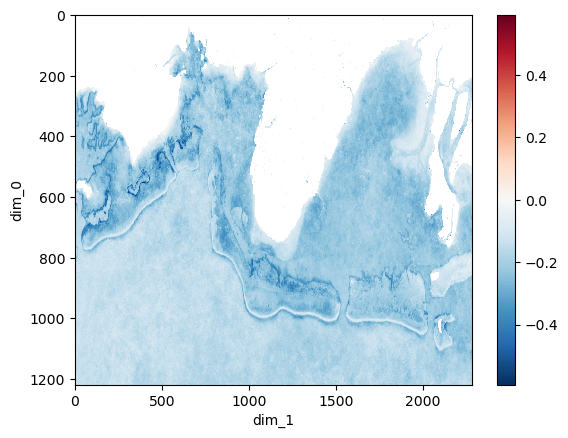

In [26]:
ndti_mask = ndti < 0.2
ndti_masked_raster = np.ma.masked_where(~ndti_mask, ndti)
ndti_masked_raster_da = xr.DataArray(ndti_masked_raster)
ndti_masked_raster_da.plot.imshow(origin="upper")

In [27]:
# Clip da1 using the mask from da2
clipped_ds = clipped_ds.where(ndti_mask)
# clipped_da = clipped_da.squeeze()
# clipped_da = clipped_da.rename({"dim_0": "y", "dim_1": "x"})
# clipped_da.plot(ax=ax[1], cmap=cmap_ndti, add_colorbar=True, vmin=vmin, vmax=vmax);
# clipped_da.plot.imshow(origin="upper")
clipped_ds
print(clipped_ds)

<xarray.Dataset> Size: 178MB
Dimensions:      (y: 1219, x: 2279, band: 17)
Coordinates:
  * y            (y) float64 10kB -2.036e+06 -2.036e+06 ... -2.048e+06
  * x            (x) float64 18kB 3.154e+06 3.154e+06 ... 3.176e+06 3.177e+06
    spatial_ref  int32 4B 3832
    time         datetime64[ns] 8B 2024-01-01
  * band         (band) <U8 544B 'nir' 'red' 'blue' ... 'rededge2' 'rededge3'
Data variables: (12/16)
    nir          (y, x) float32 11MB dask.array<chunksize=(1219, 2048), meta=np.ndarray>
    red          (y, x) float32 11MB dask.array<chunksize=(1219, 2048), meta=np.ndarray>
    blue         (y, x) float32 11MB dask.array<chunksize=(1219, 2048), meta=np.ndarray>
    green        (y, x) float32 11MB dask.array<chunksize=(1219, 2048), meta=np.ndarray>
    emad         (y, x) float32 11MB dask.array<chunksize=(1219, 2048), meta=np.ndarray>
    smad         (y, x) float32 11MB dask.array<chunksize=(1219, 2048), meta=np.ndarray>
    ...           ...
    swir16       (y, x) floa

### White Water Index (WWI)

Developed specifically to detect foam, whitecaps, and breaking waves:
WWI=Blue−RedBlue+Red
WWI=Blue+RedBlue−Red​

    Bands: Blue (e.g., Sentinel-2 B2) and Red (e.g., Sentinel-2 B4)
    Reasoning: White water is bright in the Blue band and less reflective in the Red band.

In [28]:
# clipped_da = clipped_da.to_array()
clipped_ds.odc.explore(bands=("red", "green", "blue"), vmin=0, vmax=0.3)

# clipped_da.plot.imshow(origin="upper")

In [29]:
# No need to convert to data array
# print(type(clipped_da))
# clipped_da = clipped_da.to_array(dim="band")

In [30]:
clipped_ds.to_zarr("suva-masked-geomad-v2-2024.zarr")

ContainsGroupError: path '' contains a group

### Congratulations you have completed this activity. Let the instructors know if you have any questions. Otherwise, move onto the next activity 

<font color='green'>The objective of this notebook was to train the machine learning model that will allow us to classify an area with land cover classes defined through the training data. </font>

<font color='blue'>Finished</font>

In [ ]:
print("Finished, well done")